# **Import Dataset From Drive**

In [1]:
import pandas as pd
data=pd.read_csv(r"/content/drive/MyDrive/Colab Notebooks/Crop_Data.csv")

# **Analyze The Data**

In [2]:
data.head()

,Crop,Season,State,Area,Soil Type,Pesticide Usage,pH,Temperature,Fertilizer Usage,Price,Rainfall
0,Cotton(lint),Kharif,Assam,1739.0,Black Soil,low,Average,Medium,High,2490.092421,3373.2
1,Onion,Whole Year,Assam,7832.0,Alluvial Soil,high,Low,Low,Medium,2348.904922,3520.7
2,Potato,Whole Year,Assam,75259.0,Laterile Soil,low,Average,High,High,2448.287513,2957.4
3,Rice,Autumn,Assam,607358.0,Alluvial Soil,low,Low,High,High,2714.419518,3079.6
4,Rice,Summer,Assam,174974.0,Black Soil,high,Low,Low,Low,2883.356997,2566.7


In [31]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5373 entries, 0 to 5372
Data columns (total 11 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Crop              5373 non-null   object 
 1   Season            5373 non-null   object 
 2   State             5373 non-null   object 
 3   Area              5373 non-null   float64
 4   Soil Type         5373 non-null   object 
 5   Pesticide Usage   5373 non-null   object 
 6   pH                5373 non-null   object 
 7   Temperature       5373 non-null   object 
 8   Fertilizer Usage  5373 non-null   object 
 9   Price             5373 non-null   float64
 10  Rainfall          5373 non-null   float64
dtypes: float64(3), object(8)
memory usage: 461.9+ KB


# **Handaling Null Values**

In [4]:
data.isnull().sum()/len(data)

Crop                0.0
Season              0.0
State               0.0
Area                0.0
Soil Type           0.0
Pesticide Usage     0.0
pH                  0.0
Temperature         0.0
Fertilizer Usage    0.0
Price               0.0
Rainfall            0.0
dtype: float64

## **Statical Analysis**

In [32]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Area,5373.0,394538.865698,1.060867e+06,1.0,2590.000000,22596.000000,211000.000000,10216517.0
Price,5373.0,2553.190129,4.837197e+02,1005.0,2297.975728,2508.496079,2733.320514,4983.0
Rainfall,5373.0,1496.015241,8.785391e+02,62.3,852.500000,1218.400000,2068.050000,6331.1


# **Check Dublicates**

In [33]:
data.duplicated().sum()

0

In [28]:
data['Crop'].unique()

array(['Cotton(lint)', 'Onion', 'Potato', 'Rice', 'Sugarcane', 'Wheat',
       'Groundnut', 'Ragi', 'Banana'], dtype=object)

In [7]:
data

,Crop,Season,State,Area,Soil Type,Pesticide Usage,pH,Temperature,Fertilizer Usage,Price,Rainfall
0,Cotton(lint),Kharif,Assam,1739.0,Black Soil,low,Average,Medium,High,2490.092421,3373.20
1,Onion,Whole Year,Assam,7832.0,Alluvial Soil,high,Low,Low,Medium,2348.904922,3520.70
2,Potato,Whole Year,Assam,75259.0,Laterile Soil,low,Average,High,High,2448.287513,2957.40
3,Rice,Autumn,Assam,607358.0,Alluvial Soil,low,Low,High,High,2714.419518,3079.60
4,Rice,Summer,Assam,174974.0,Black Soil,high,Low,Low,Low,2883.356997,2566.70
...,...,...,...,...,...,...,...,...,...,...,...
5368,Wheat,Summer,Odisha,147.0,Black Soil,high,Average,High,High,3707.000000,821.39
5369,Rice,Kharif,Nagaland,141000.0,Black Soil,high,Average,Medium,Medium,3406.000000,2988.96
5370,Wheat,Rabi,Nagaland,1000.0,Black Soil,high,High,Low,High,3949.000000,1492.70
5371,Rice,Kharif,Jammu and Kashmir,275746.0,Black Soil,low,High,High,High,2842.000000,1688.34


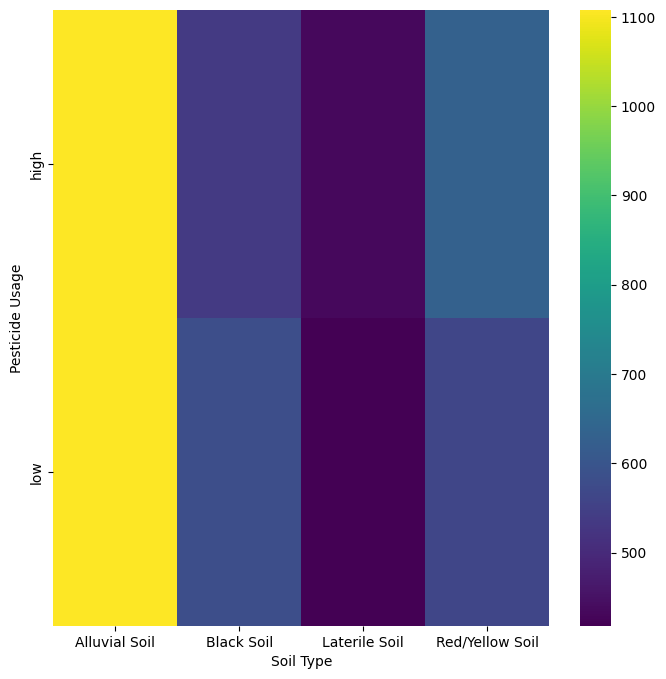

In [8]:
# @title Soil Type vs Pesticide Usage

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['Pesticide Usage'].value_counts()
    for x_label, grp in data.groupby('Soil Type')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('Soil Type')
_ = plt.ylabel('Pesticide Usage')

<ipython-input-9-39cdf74eeedf>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data, x='Area', y='pH', inner='box', palette='Dark2')


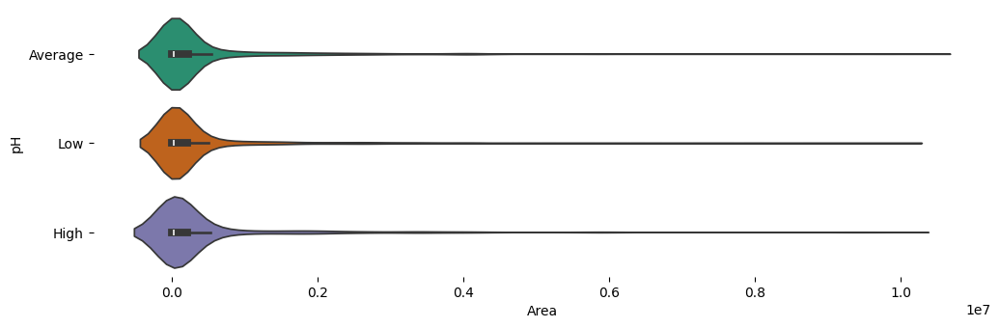

In [9]:
# @title pH vs Area

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(data['pH'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(data, x='Area', y='pH', inner='box', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

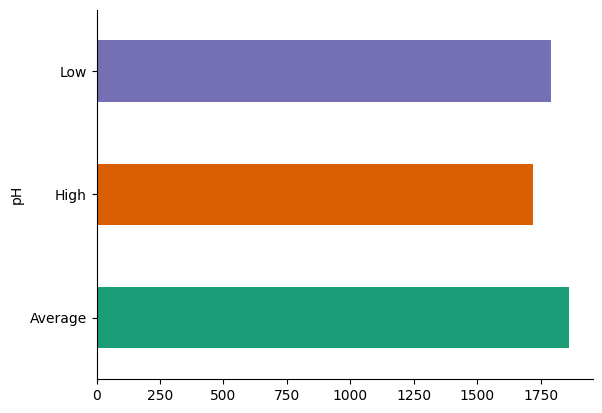

In [10]:
# @title pH

from matplotlib import pyplot as plt
import seaborn as sns
data.groupby('pH').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

<Axes: xlabel='Rainfall', ylabel='Price'>

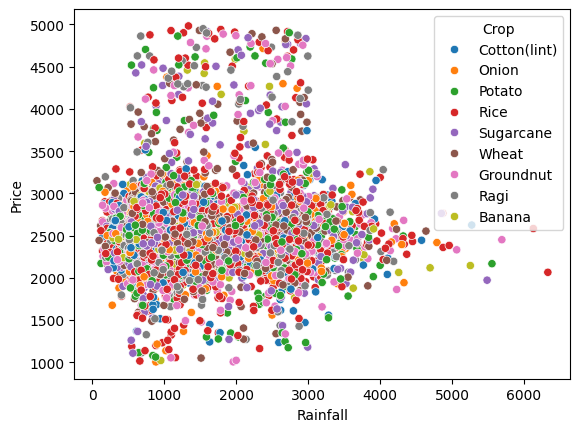

In [11]:
# @title Rainfall vs Crop Yield

sns.scatterplot(x='Rainfall', y='Price', data=data, hue='Crop')

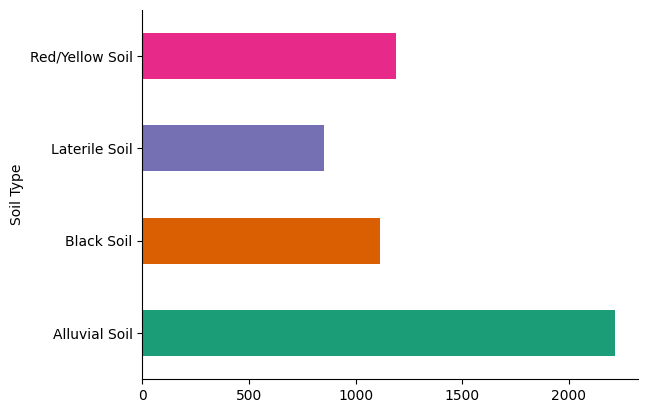

In [12]:
# @title Soil Type

from matplotlib import pyplot as plt
import seaborn as sns
data.groupby('Soil Type').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

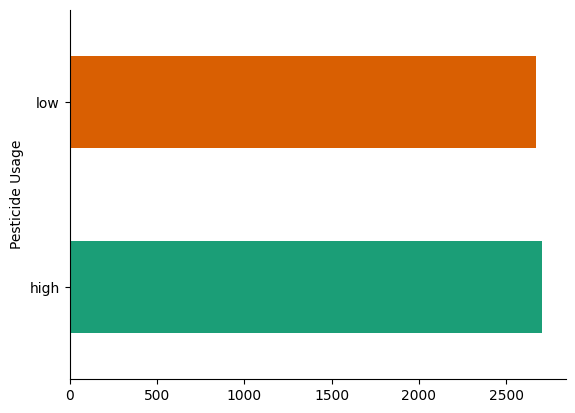

In [13]:
# @title Pesticide Usage

from matplotlib import pyplot as plt
import seaborn as sns
data.groupby('Pesticide Usage').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

<Axes: xlabel='Season', ylabel='Price'>

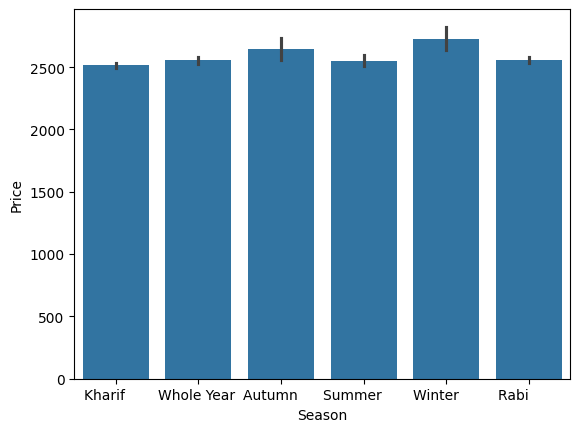

In [14]:
# @title Average Price by Season

sns.barplot(x="Season", y="Price", data=data)

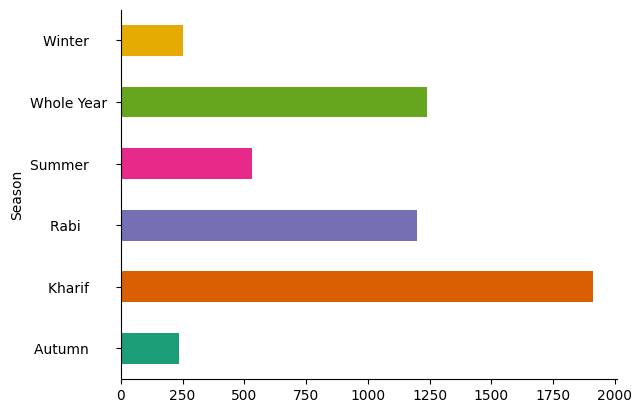

In [15]:
# @title Season

from matplotlib import pyplot as plt
import seaborn as sns
data.groupby('Season').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

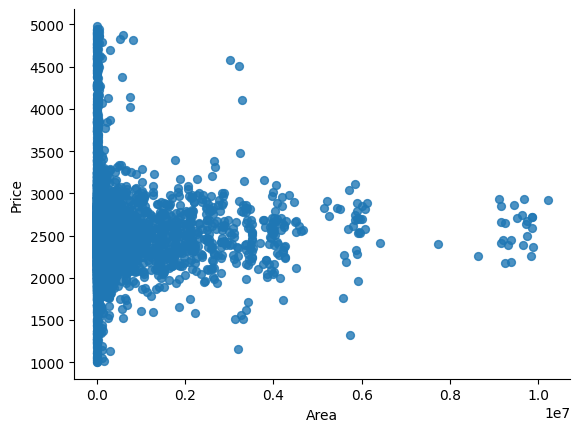

In [16]:
# @title Area vs Price

from matplotlib import pyplot as plt
data.plot(kind='scatter', x='Area', y='Price', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

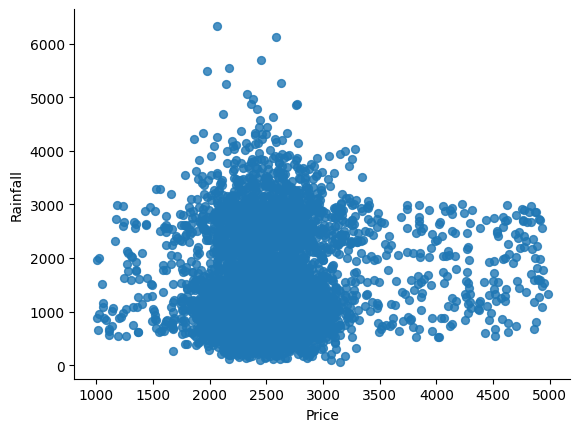

In [17]:
# @title Price vs Rainfall

from matplotlib import pyplot as plt
data.plot(kind='scatter', x='Price', y='Rainfall', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

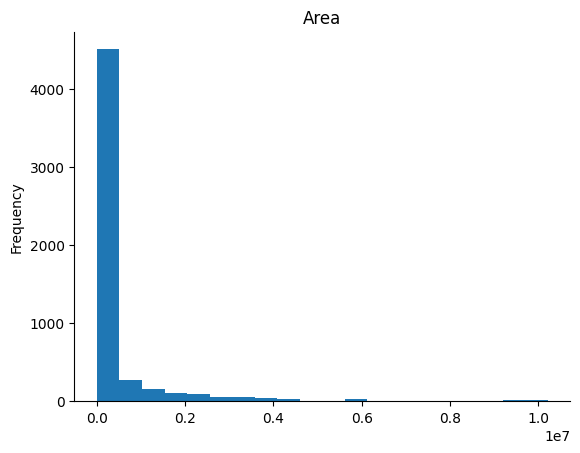

In [18]:
# @title Area

from matplotlib import pyplot as plt
data['Area'].plot(kind='hist', bins=20, title='Area')
plt.gca().spines[['top', 'right',]].set_visible(False)

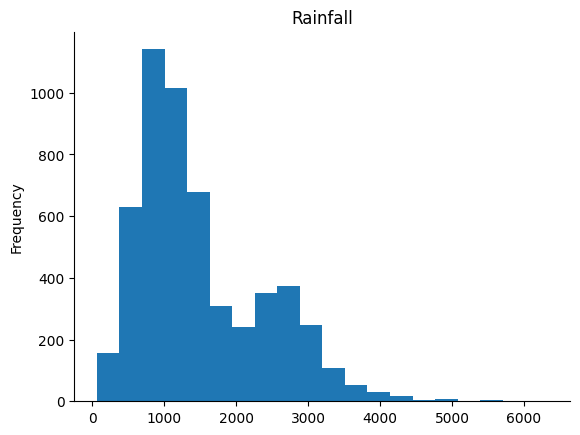

In [19]:
# @title Rainfall

from matplotlib import pyplot as plt
data['Rainfall'].plot(kind='hist', bins=20, title='Rainfall')
plt.gca().spines[['top', 'right',]].set_visible(False)

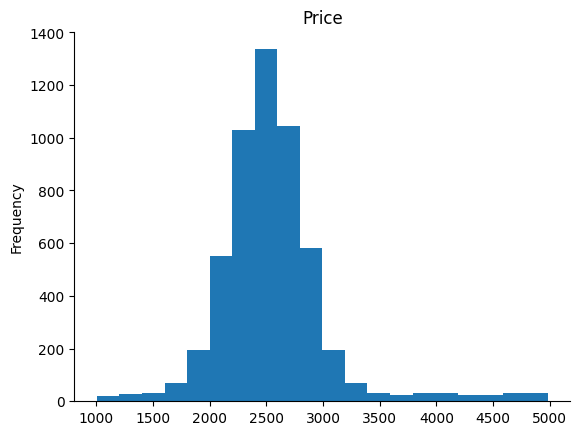

In [24]:


from matplotlib import pyplot as plt
data['Price'].plot(kind='hist', bins=20, title='Price')
plt.gca().spines[['top', 'right',]].set_visible(False)

In [21]:
#!pip install ydata-profiling --upgrade

# **EDA** **Using ydata prfiling**

In [29]:

# import pandas as pd
# from ydata_profiling import ProfileReport



# # Generate the report
# profile = ProfileReport(data)

# # Display the report
# profile.to_widgets()



/usr/local/lib/python3.10/dist-packages/ydata_profiling/profile_report.py:533: UserWarning: Ipywidgets is not yet fully supported on Google Colab (https://github.com/googlecolab/colabtools/issues/60).As an alternative, you can use the HTML report. See the documentation for more information.
  warnings.warn(


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

# **Numerical Data Feature Transformation**

In [36]:
cat_column=data.select_dtypes(include='object').columns
num_column=data.select_dtypes(exclude='object').columns

In [37]:
num_column

Index(['Area', 'Price', 'Rainfall'], dtype='object')

In [38]:
  from sklearn.preprocessing import StandardScaler, PowerTransformer

  sc=StandardScaler()
  scaled_data=sc.fit_transform(data[num_column])

In [43]:
pt=PowerTransformer(method='yeo-johnson')
Power_data=pt.fit_transform(scaled_data)

In [44]:
num_data=pd.DataFrame(Power_data,columns=num_column)
num_data

,Area,Price,Rainfall
0,-0.749042,-0.009864,1.702042
1,-0.697343,-0.357815,1.775552
2,-0.179769,-0.109377,1.476736
3,1.606092,0.471465,1.546010
4,0.423043,0.788461,1.234296
...,...,...,...
5368,-0.762692,2.044696,-0.801975
5369,0.237411,1.625822,1.494894
5370,-0.755371,2.358433,0.277378
5371,0.870465,0.713633,0.503151


# **Categorical Data Feature Transformation**

In [54]:
from sklearn.preprocessing import OneHotEncoder
import pandas as pd

# Assuming cat_column is a list of categorical column names
ohe = OneHotEncoder()
encoded_data = ohe.fit_transform(data[cat_column])

# Convert the encoded data to a DataFrame
cat_data = pd.DataFrame(encoded_data.toarray(), columns=ohe.get_feature_names_out())
cat_data


,Crop_Banana,Crop_Cotton(lint),Crop_Groundnut,Crop_Onion,Crop_Potato,Crop_Ragi,Crop_Rice,Crop_Sugarcane,Crop_Wheat,Season_Autumn,...,Pesticide Usage_low,pH_Average,pH_High,pH_Low,Temperature_High,Temperature_Low,Temperature_Medium,Fertilizer Usage_High,Fertilizer Usage_Low,Fertilizer Usage_Medium
0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
1,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0
2,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,...,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5368,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
5369,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
5370,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
5371,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0


# **Concatenate cat_data and num_data**

In [58]:
dataset=pd.concat([cat_data,num_data],axis=1)
dataset

,Crop_Banana,Crop_Cotton(lint),Crop_Groundnut,Crop_Onion,Crop_Potato,Crop_Ragi,Crop_Rice,Crop_Sugarcane,Crop_Wheat,Season_Autumn,...,pH_Low,Temperature_High,Temperature_Low,Temperature_Medium,Fertilizer Usage_High,Fertilizer Usage_Low,Fertilizer Usage_Medium,Area,Price,Rainfall
0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,1.0,0.0,0.0,-0.749042,-0.009864,1.702042
1,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,1.0,0.0,0.0,0.0,1.0,-0.697343,-0.357815,1.775552
2,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,-0.179769,-0.109377,1.476736
3,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,...,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.606092,0.471465,1.546010
4,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.423043,0.788461,1.234296
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5368,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,-0.762692,2.044696,-0.801975
5369,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.237411,1.625822,1.494894
5370,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,-0.755371,2.358433,0.277378
5371,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.870465,0.713633,0.503151


# **Split Train And Test**

In [70]:
X = dataset.drop(columns=['Price'])
y = dataset['Price']


In [96]:
print(X.shape)
print(y.shape)

(5373, 62)
(5373,)


# ***Feature selection using a model***


In [97]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import SelectFromModel

In [98]:
rf=RandomForestRegressor(n_estimators=100)
feature_sel_from_model=SelectFromModel(rf)



In [99]:
feature_sel_from_model.fit(X,y)

SelectFromModel(estimator=RandomForestRegressor())

In [102]:
cols=X.columns

In [101]:
select_feathers=cols[feature_sel_from_model.get_support()]
select_feathers

Index(['State_Arunachal Pradesh', 'Soil Type_Alluvial Soil',
       'Soil Type_Red/Yellow Soil', 'pH_Average', 'pH_High', 'pH_Low',
       'Temperature_High', 'Temperature_Low', 'Temperature_Medium',
       'Fertilizer Usage_High', 'Fertilizer Usage_Low',
       'Fertilizer Usage_Medium', 'Area', 'Rainfall'],
      dtype='object')

In [103]:
X=X[select_feathers]
X

,State_Arunachal Pradesh,Soil Type_Alluvial Soil,Soil Type_Red/Yellow Soil,pH_Average,pH_High,pH_Low,Temperature_High,Temperature_Low,Temperature_Medium,Fertilizer Usage_High,Fertilizer Usage_Low,Fertilizer Usage_Medium,Area,Rainfall
0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,-0.749042,1.702042
1,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,-0.697343,1.775552
2,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,-0.179769,1.476736
3,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.606092,1.546010
4,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.423043,1.234296
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5368,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,-0.762692,-0.801975
5369,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.237411,1.494894
5370,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,-0.755371,0.277378
5371,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.870465,0.503151


In [104]:
y

0      -0.009864
1      -0.357815
2      -0.109377
3       0.471465
4       0.788461
          ...   
5368    2.044696
5369    1.625822
5370    2.358433
5371    0.713633
5372   -1.185221
Name: Price, Length: 5373, dtype: float64

In [105]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5373 entries, 0 to 5372
Data columns (total 14 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   State_Arunachal Pradesh    5373 non-null   float64
 1   Soil Type_Alluvial Soil    5373 non-null   float64
 2   Soil Type_Red/Yellow Soil  5373 non-null   float64
 3   pH_Average                 5373 non-null   float64
 4   pH_High                    5373 non-null   float64
 5   pH_Low                     5373 non-null   float64
 6   Temperature_High           5373 non-null   float64
 7   Temperature_Low            5373 non-null   float64
 8   Temperature_Medium         5373 non-null   float64
 9   Fertilizer Usage_High      5373 non-null   float64
 10  Fertilizer Usage_Low       5373 non-null   float64
 11  Fertilizer Usage_Medium    5373 non-null   float64
 12  Area                       5373 non-null   float64
 13  Rainfall                   5373 non-null   float

# **Building a Machine Learning Model**

In [107]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,train_size=0.2,random_state=42)

# **Experimenting with Multiple Algorithms for Model Building**

In [109]:
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.neighbors import KNeighborsRegressor

In [112]:
# Create an empty list to store models
models = []

# Append models to the list
models.append(('LinearRegression', LinearRegression()))
models.append(('SVR', SVR()))
models.append(('RandomForestRegressor', RandomForestRegressor()))
models.append(('XGBRegressor', XGBRegressor()))
models.append(('KNeighborsRegressor', KNeighborsRegressor()))

# Print the list of models
print(models)


[('LinearRegression', LinearRegression()), ('SVR', SVR()), ('RandomForestRegressor', RandomForestRegressor()), ('XGBRegressor', XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)), ('KNeighborsRegressor', KNeighborsRegressor())]


In [114]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

for name, model in models:
    print("\033[1mAlgorithm name : "+name+"\033[0m")
    model.fit(X_train, y_train)

    predictions = model.predict(X_test)

    mse = mean_squared_error(predictions, y_test)
    rmse = mean_squared_error(predictions, y_test, squared=False)
    mae = mean_absolute_error(predictions, y_test)

    # Calculate R-squared score
    r2 = r2_score(y_test, predictions)

    print("Mean Squared Error (MSE):", mse)
    print("Root Mean Squared Error (RMSE):", rmse)
    print("Mean Absolute Error (MAE):", mae)
    print("R-squared Score (R2):", r2)


Algorithm name : LinearRegression
Mean Squared Error (MSE): 1.0297780140801467
Root Mean Squared Error (RMSE): 1.0147797860029273
Mean Absolute Error (MAE): 0.7180465434710003
R-squared Score (R2): -0.04616723789168442
Algorithm name : SVR
Mean Squared Error (MSE): 1.0289711831568438
Root Mean Squared Error (RMSE): 1.0143821681973928
Mean Absolute Error (MAE): 0.7297938669522666
R-squared Score (R2): -0.0453475660139242
Algorithm name : RandomForestRegressor
Mean Squared Error (MSE): 1.1170711674016605
Root Mean Squared Error (RMSE): 1.05691587527185
Mean Absolute Error (MAE): 0.7644333716755726
R-squared Score (R2): -0.13484968774841244
Algorithm name : XGBRegressor
Mean Squared Error (MSE): 1.3746152169060808
Root Mean Squared Error (RMSE): 1.172439856413147
Mean Absolute Error (MAE): 0.8612112968876768
R-squared Score (R2): -0.39649262750970804
Algorithm name : KNeighborsRegressor
Mean Squared Error (MSE): 1.1742681820033545
Root Mean Squared Error (RMSE): 1.083636554386827
Mean Abs

In [117]:
# prompt: in my above results make a dataframe

import pandas as pd

# Create a dictionary to store the results
results = {
    'Algorithm': [],
    'MSE': [],
    'RMSE': [],
    'MAE': [],
    'R2': []
}

# Iterate over the models and store the results
for name, model in models:
    results['Algorithm'].append(name)
    results['MSE'].append(mean_squared_error(y_test, model.predict(X_test)))
    results['RMSE'].append(mean_squared_error(y_test, model.predict(X_test), squared=False))
    results['MAE'].append(mean_absolute_error(y_test, model.predict(X_test)))
    results['R2'].append(r2_score(y_test, model.predict(X_test)))

# Create a DataFrame from the results dictionary
df = pd.DataFrame(results)

# Display the DataFrame
print(df.to_string())


                   Model       MSE      RMSE       MAE        R2
0       LinearRegression  1.029778  1.014780  0.718047 -0.046167
1                    SVR  1.028971  1.014382  0.729794 -0.045348
2  RandomForestRegressor  1.117071  1.056916  0.764433 -0.134850
3           XGBRegressor  1.374615  1.172440  0.861211 -0.396493
4    KNeighborsRegressor  1.174268  1.083637  0.795232 -0.192957
